# Quickstart: NOAA GEFS analysis - dynamical.org Zarr
A brief introduction to the NOAA GEFS analysis dataset transformed into an analysis-ready, cloud-optimized format by dynamical.org.

Dataset documentation: https://dynamical.org/catalog/noaa-gefs-analysis/

In [ ]:
# If running locally, follow README.md for simple dependency installation.
# If using Google Colab, run this cell and then restart the notebook.
%pip install "xarray[complete]>=2025.1.2" "zarr>=3.0.8" requests aiohttp

In [1]:
import xarray as xr

ds = xr.open_zarr("https://data.dynamical.org/noaa/gefs/analysis/latest.zarr", chunks=None)
ds

<xarray.Dataset> Size: 7TB
Dimensions:                                     (time: 76270, latitude: 721,
                                                 longitude: 1440)
Coordinates:
  * latitude                                    (latitude) float64 6kB 90.0 ....
  * longitude                                   (longitude) float64 12kB -180...
    spatial_ref                                 int64 8B ...
  * time                                        (time) datetime64[ns] 610kB 2...
Data variables: (12/21)
    categorical_freezing_rain_surface           (time, latitude, longitude) float32 317GB ...
    categorical_ice_pellets_surface             (time, latitude, longitude) float32 317GB ...
    categorical_rain_surface                    (time, latitude, longitude) float32 317GB ...
    categorical_snow_surface                    (time, latitude, longitude) float32 317GB ...
    downward_long_wave_radiation_flux_surface   (time, latitude, longitude) float32 317GB ...
    downward_short_wave_radiation_flux_surface  (time, latitude, longitude) float32 317GB ...
    ...                                          ...
    temperature_2m                              (time, latitude, longitude) float32 317GB ...
    total_cloud_cover_atmosphere                (time, latitude, longitude) float32 317GB ...
    wind_u_100m                                 (time, latitude, longitude) float32 317GB ...
    wind_u_10m                                  (time, latitude, longitude) float32 317GB ...
    wind_v_100m                                 (time, latitude, longitude) float32 317GB ...
    wind_v_10m                                  (time, latitude, longitude) float32 317GB ...
Attributes:
    dataset_id:          noaa-gefs-analysis
    dataset_version:     0.1.2
    name:                NOAA GEFS analysis
    description:         Weather analysis from the Global Ensemble Forecast S...
    attribution:         NOAA NWS NCEP GEFS data processed by dynamical.org f...
    spatial_domain:      Global
    spatial_resolution:  0.25 degrees (~20km)
    time_domain:         2000-01-01 00:00:00 UTC to Present
    time_resolution:     3.0 hours

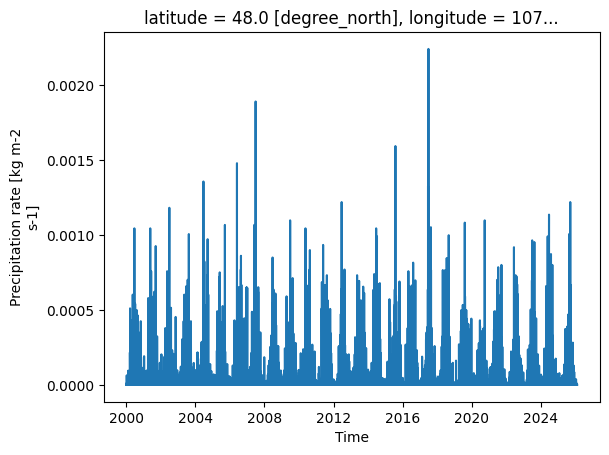

In [2]:
# Precipitation over time in Ulaanbaatar, Mongolia
ds["precipitation_surface"].sel(latitude=47.9, longitude=106.9, method="nearest").plot()

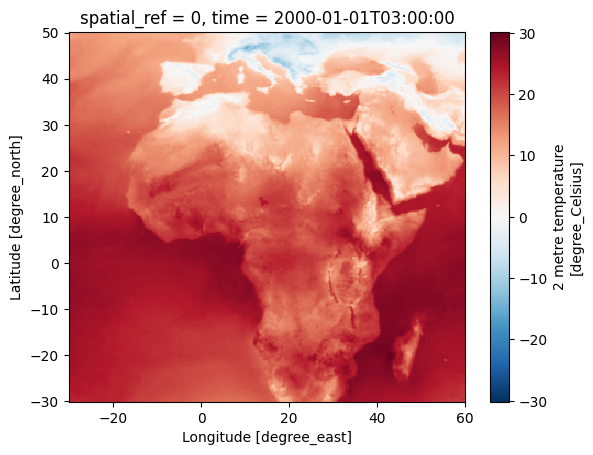

In [3]:
# Map of temperature across Africa at the earliest available time in the dataset
ds["temperature_2m"].sel(
    time="2000-01-01T03:00",
    latitude=slice(50, -30),
    longitude=slice(-30, 60),
).plot()

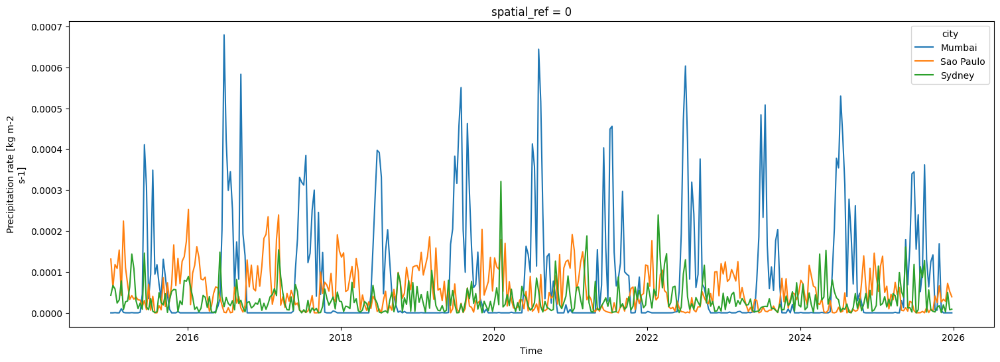

In [4]:
import pandas as pd

# Select multiple locations and aggregate precipitation to 10 day averages

cities = pd.DataFrame([
    {"city": "Mumbai",    "latitude":  19.07, "longitude":  72.87},
    {"city": "Sao Paulo", "latitude": -23.55, "longitude": -46.63},
    {"city": "Sydney",    "latitude": -33.87, "longitude": 151.21},
]).set_index("city").to_xarray()

(
  ds["precipitation_surface"]
    .sel(time=slice("2015", "2025"))
    .sel(latitude=cities.latitude, longitude=cities.longitude, method="nearest")
    .resample(time="10d").mean()
    .plot(hue="city", size=6, aspect=3)
)

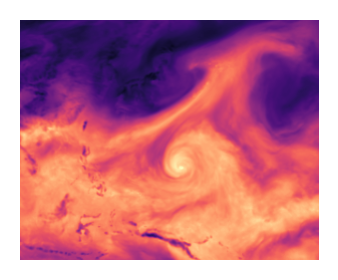

In [5]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt

# An interactive animation of precipitable water in the atmosphere during Typhoon Mawar

data = (
    ds["precipitable_water_atmosphere"]
    .sel( # Typhoon Mawar
        time=slice("2023-05-24T00", "2023-06-05T00"),
        latitude=slice(50, -10),  
        longitude=slice(105, 180), 
    ).load()
)

dpi=200
fig, ax = plt.subplots(figsize=(data.longitude.size/dpi, data.latitude.size/dpi), dpi=dpi)
fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
ax.axis("off")

img = ax.imshow(data.isel(time=0), cmap='magma', vmin=0, vmax=75)
anim = FuncAnimation(fig=fig, frames=data, func=lambda frame: img.set_data(frame), interval=80)

HTML(anim.to_jshtml())